## 1. Import Packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
import csv
import cv2
import glob as glob
import albumentations as A
import requests
import zipfile
import random
import shutil

from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.applications import VGG16, Xception
import tensorflow as tf
from tensorflow.keras import layers, regularizers
import albumentations as A
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import Sequence
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import (Input, Conv2D, MaxPooling2D, AveragePooling2D,
                                     Conv2DTranspose, BatchNormalization, Activation,
                                     Dropout, UpSampling2D, Concatenate)
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.utils import image_dataset_from_directory
#from segmentation_models import DeepLabV3Plus

from matplotlib.ticker import (MultipleLocator, FormatStrFormatter)
from dataclasses import dataclass
from tensorflow.python.ops.numpy_ops import np_config
from tensorflow.keras.layers import (Input, Conv2D, MaxPooling2D, AveragePooling2D,
                                     Conv2DTranspose, BatchNormalization, Activation,
                                     Dropout, UpSampling2D, Concatenate, Add, SpatialDropout2D, Rescaling, Reshape, Flatten, Dense, ZeroPadding2D)
np_config.enable_numpy_behavior()


block_plot = False
plt.rcParams['image.cmap'] = 'gray'

strategy = tf.distribute.experimental.MultiWorkerMirroredStrategy()
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

# install/upgrade the Keras CV library from the GitHub repository
!pip install -q git+https://github.com/keras-team/keras-cv.git --upgrade

from zipfile import ZipFile
from dataclasses import dataclass

import keras_cv

import matplotlib.pyplot as plt

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Number of devices: 2


/usr/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


## 2. Create a Custom Dataset Class

In [2]:
# Custom Class for creating training and validation (segmentation) dataset objects.
class CustomSegDataLoader(Sequence):

    
    def __init__(self, batch_size, image_size, image_paths, mask_paths, num_classes, aug):

        
        self.batch_size  = batch_size
        self.image_size  = image_size
        self.image_paths = image_paths
        self.mask_paths  = mask_paths
        self.num_classes = num_classes
        self.aug = aug

        
        self.x = np.empty((self.batch_size,) + self.image_size + (3,), dtype="float32")
        self.y = np.empty((self.batch_size,) + self.image_size, dtype="float32")

        
        if self.aug:
            self.train_transforms = self.transforms()

        
        self.resize_transforms = self.resize()
        
    def __len__(self):

        return len(self.mask_paths) // self.batch_size



    def transforms(self):

        
        # Data augmentation.
        train_transforms = A.Compose ([
            # Horizontal/vertical flipping
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),  
            A.Rotate(limit=90, p=0.5),

            # Random scaling (zooming in/out)
            A.ShiftScaleRotate(
                shift_limit=0.1,   
                scale_limit=0.2,   
                rotate_limit=0,    
                p=0.5              
            ),

            # Random brightness and contrast adjustment
            A.RandomBrightnessContrast(
                brightness_limit=0.2,  
                contrast_limit=0.2,    
                p=0.5
            ),
            
        ])
        
        return train_transforms

    
    def resize(self):

        resize_transforms = A.Resize(
            height=self.image_size[0], width=self.image_size[1],
            interpolation=cv2.INTER_NEAREST,
            always_apply=True, p=1
        )
        return resize_transforms


    
    def reset_array(self):
        self.x.fill(0.)
        self.y.fill(0.)
    
    
    def __getoneitem__(self, idx):
        self.reset_array()

        
        image_singel = self.image_paths[idx]
        mask_singel = self.mask_paths[idx]

        
        return image_singel, mask_singel


    def __getitem__(self, idx):
        self.reset_array()
        i = idx * self.batch_size
        batch_image_paths = self.image_paths[i : i + self.batch_size]
        batch_mask_paths = self.mask_paths[i : i + self.batch_size]

        mean = np.array([0.485, 0.456, 0.406]) # from Imagenet
        std = np.array([0.229, 0.224, 0.225]) # from Imagenet
        
        for j, (input_image, input_mask) in enumerate(zip(batch_image_paths, batch_mask_paths)):

            # Read the image and convert to RGB.
            img = cv2.imread(input_image)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Read the mask and convert to RGB.
            msk = cv2.imread(input_mask)
            msk = cv2.cvtColor(msk, cv2.COLOR_BGR2RGB)

            # Resize the image and mask.
            resized  = self.resize_transforms(image=img, mask=msk)
            img, msk = resized['image'], resized['mask']

            
            if self.aug:
                # Apply augmentations.
                train_augment = self.train_transforms(image=img, mask=msk)
                img, msk = train_augment['image'], train_augment['mask']
            
            # Store image in x.
            self.x[j] = img # divide by 255. if I want to normalize image to be in range [0.0, 1.0]
            
            # Convert RGB segmentation mask to multi-channel (one-hot) encoded arrays where 
            # each channel represents a single class whose pixel values are either 0 or 1, 
            # where a 1 represents a pixel location associated with the class that corresponds 
            # to the channel.
            msk = rgb_to_onehot(msk)
            
            # Convert the multi-channel (one-hot encoded) mask to a single channel (grayscale)   
            # representation whose values contain the class IDs for each class (essentially 
            # collapsing the one-hot encoded arrays into a single channel).
            self.y[j] = msk.argmax(-1)

            # For models like Unet, use one hot encoded labels : 
            #self.y[j] = msk 

            
        return self.x, self.y

## 3. Dataset and Training Configuration

In [3]:
@dataclass(frozen=True)
class DatasetConfig:
    NUM_CLASSES: int = 10
    IMG_WIDTH:   int = 256
    IMG_HEIGHT:  int = 256
    DATA_SHAPE: tuple = (IMG_WIDTH, IMG_HEIGHT, 3)
    BASE_DIR: str = '/kaggle/working/'
    DATA_TRAIN_IMAGES: str = f'{BASE_DIR}/training_images/images/*.jpg'
    DATA_TRAIN_LABELS: str = f'{BASE_DIR}/training_images/masks/*.png'
    DATA_VALID_IMAGES: str = f'{BASE_DIR}/validation_images/images/*.jpg'
    DATA_VALID_LABELS: str = f'{BASE_DIR}/validation_images/masks/*.png'
    DATA_TEST_IMAGES:  str = '/kaggle/input/open-cv-tf-project-3-image-segmentation-round-3/Project_3_FloodNet_Dataset/test/images/*.jpg'

@dataclass(frozen=True)
class TrainingConfig:
    MODEL:           str = "resnet50_v2_imagenet"
    BATCH_SIZE:      int = 8
    EPOCHS:          int = 50
    LEARNING_RATE: float = 0.0001
    CHECKPOINT_DIR:  str = 'model_checkpoint_shahzadv2/DeepLab_FLOODNET'

# Dictionnary for each class RGB values
id2color = {

    0: (0,  0,    0),  # BW: Background/waterbody = BLACK
    1: (255,  0,  0),  # Building Flooded         = RED
    2: (200,  90,90),  # Building Non-Flooded     = LIGHT RED 
    3: (128, 128, 0),  # Road flooded             = BROWN 
    4: (155,155,155),  # Road Non-flooded         = GREY
    5: (0, 255, 255),  # Water                    = CYAN
    6: (55, 0,  255),  # Tree                     = BLUE
    7: (255, 0, 255),  # Vehicle                  = PURPLE
    8: (245, 245, 0),  # Pool                     = YELLOW
    9: (0, 255, 0),    # Grass                    = GREEN
 }


## 4. Visualize the Dataset 

In [4]:
# Function to display the original images, their respective masks and the overlay of the images with their masks
def display_image_and_mask(data_list, color_mask=False, color_map=id2color):
    

    plt.figure(figsize=(16, 6))
    title = ['GT Image', 'GT Mask', 'Overlayed Mask']
    grayscale_gt_mask = data_list[1]
    
    # Create RGB segmentation map from grayscale segmentation map.
    rgb_gt_mask = num_to_rgb(data_list[1], color_map=color_map)
    # Create the overlayed image.
    overlayed_image = image_overlay(data_list[0], rgb_gt_mask)
    
    data_list.append(overlayed_image)

    for i in range(len(data_list)):
        plt.subplot(1, len(data_list), i+1)
        plt.title(title[i])
        if title[i] == 'GT Mask':
            if color_mask:
                plt.imshow(np.array(rgb_gt_mask))
            else:
                plt.imshow(np.array(grayscale_gt_mask))
        else:
            if i ==0:
                plt.imshow(np.array(data_list[i]/255.))
            else:
                plt.imshow(np.array(data_list[i]))
        plt.axis('off')
        
    plt.show()

# Function to one-hot encode RGB mask labels.
def rgb_to_onehot(rgb_arr, color_map=id2color, num_classes=DatasetConfig.NUM_CLASSES):

    
    shape = rgb_arr.shape[:2] + (num_classes,)
    arr = np.zeros( shape, dtype=np.float32 )

    
    # reshape( (-1,3) ) ==> means we ask to reshape with 3 columns and nb of rows is unknown (-1 = unknown), so we ask numpy to figure out by himself. 
    for i, classes in enumerate(color_map):
        arr[:,:,i] = np.all(rgb_arr.reshape( (-1,3) ) == color_map[i], axis=1).reshape(shape[:2])

        
    return arr #shape(480,640,10) with elts from 0 to 9


# Function to convert a single channel mask representation to an RGB mask.
def num_to_rgb(num_arr, color_map=id2color):

    
    single_layer = np.squeeze(num_arr)
    output = np.zeros(num_arr.shape[:2]+(3,))

    
    for k in color_map.keys():
        output[single_layer==k] = color_map[k]

        
    return np.float32(output) / 255. # return a floating point array in range [0.0, 1.0]


# Function to overlay a segmentation map on top of an RGB image.
def image_overlay(image, segmented_image):

    
    alpha = 1.0 # Transparency for the original image.
    beta  = 0.7 # Transparency for the segmentation map.
    gamma = 0.0 # Scalar added to each sum.

    
    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)
    
    #comment the following line when using Segformer
    image = image/255. # /255. => to have elts of image from 0.0 to 1.0 like segmented_image
    
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    
    image = cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    
    return np.clip(image, 0.0, 1.0)

In [5]:
from sklearn.model_selection import train_test_split

def create_datasets(aug=False):

    image_paths = sorted(glob.glob("/kaggle/input/open-cv-tf-project-3-image-segmentation-round-3/Project_3_FloodNet_Dataset/train/images/*.jpg"))
    mask_paths = sorted(glob.glob("/kaggle/input/open-cv-tf-project-3-image-segmentation-round-3/Project_3_FloodNet_Dataset/train/masks/*.png"))

    # Split the training set into training and validation using 80-20 ration
    train_images, valid_images, train_masks, valid_masks = train_test_split(image_paths, mask_paths, test_size=0.2, random_state=42, shuffle=True)


    # Train data loader.
    train_ds = CustomSegDataLoader(batch_size=TrainingConfig.BATCH_SIZE,
                                   image_size=(DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH),
                                   image_paths=train_images,
                                   mask_paths=train_masks,
                                   num_classes=DatasetConfig.NUM_CLASSES,
                                   aug=aug,
                                  )

    # Validation data loader.
    valid_ds = CustomSegDataLoader(batch_size=TrainingConfig.BATCH_SIZE,
                                   image_size=(DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH),
                                   image_paths=valid_images,
                                   mask_paths=valid_masks,
                                   num_classes=DatasetConfig.NUM_CLASSES,
                                   aug=False,
                                  )

    
    return train_ds, valid_ds

In [6]:
# Create training and validation dataset
train_ds, valid_ds = create_datasets(aug=True)

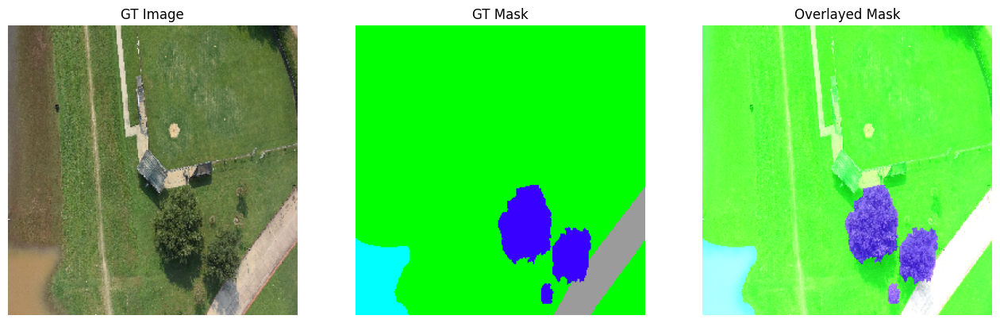

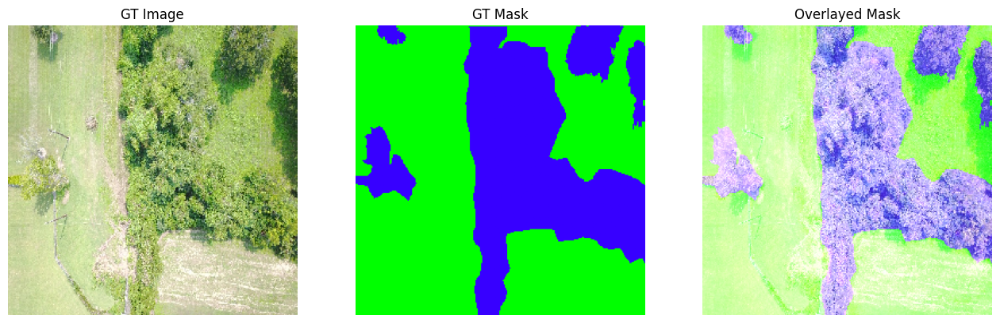

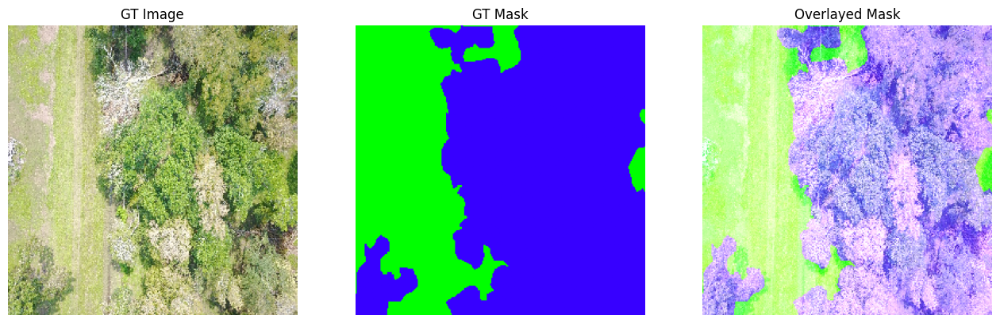

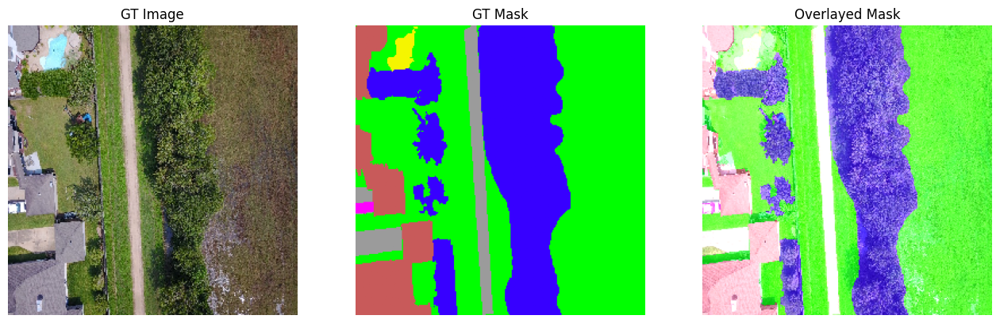

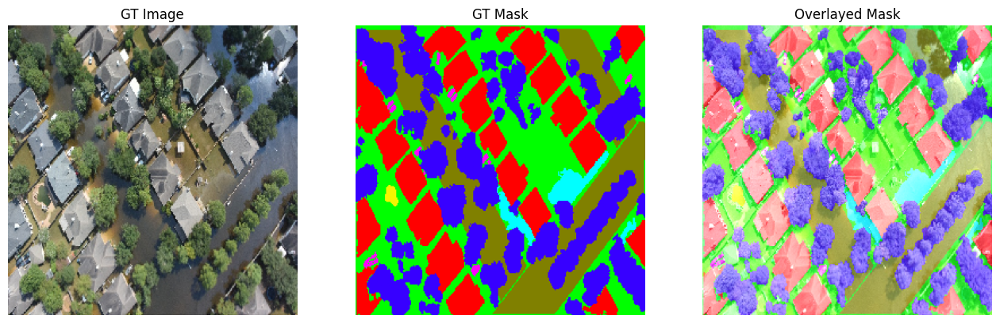

In [8]:
# Display the validation images, their respective masks and overlay
for i, (images, masks) in enumerate(valid_ds):
    if i == 5:
        break

    # Retrieve last image in data batch as an example.
    image, mask = images[-2], masks[-2]

    display_image_and_mask([image, mask], color_mask=True)


## 4. Implement a Loss function

In [9]:
# Dice loss function
def dice_coef_loss(y_true, y_pred):
    """
    Arguments:
    y_true (ndarray or tensor): Ground truth mask (G). Shape: (batch_size, height, width)
                                Sparse representation of segmentation mask.

    y_pred (ndarray or tensor): Softmax prediction (P) from the model.
                                Shape: (batch_size, height, width, num_classes).

    return (scalar): Loss
    """
    
    num_classes = y_pred.shape[-1]
    smooth = 1e-6

    y_true = tf.one_hot(tf.cast(y_true, tf.int32), num_classes, axis=-1) #Shape: (batch_size, height, width, num_classes)
    
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    
    return 1 - ((2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth))

# Categorical Cross entropy loss function
def categorical_crossentropy_loss(y_true, y_pred):
    """Compute categorical crossentropy loss."""
    num_classes = y_pred.shape[-1]
    y_true = tf.one_hot(tf.cast(y_true, tf.int32), num_classes, axis=-1) #Shape: (batch_size, height, width, num_classes)
    return tf.keras.losses.CategoricalCrossentropy()(y_true, y_pred)

# Combination of the Dice loss and Categorical Cross entropy loss
def combined_loss(y_true, y_pred):
    """Combine Dice loss and categorical crossentropy loss."""
    return 0.5 * dice_coef_loss(y_true, y_pred) + 0.5 * categorical_crossentropy_loss(y_true, y_pred)

## 6. Implement the Dice coefficient metric

In [10]:
# Dice coefficient function
def Dice_coefficient(y_true, y_pred, smooth=1e-6):
    """Compute Dice coefficient."""

    num_classes = y_pred.shape[-1]
    y_true = tf.one_hot(tf.cast(y_true, tf.int32), num_classes, axis=-1) #Shape: (batch_size, height, width, num_classes)
    smooth = 1e-6
    
    
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

## 7. Model Architecture

In [11]:
# Function for the SegFormer model with MiTBackbone with pretrained weight from keras-cv github repo
def SegFromer_Transfer_Learning(dataset_config=DatasetConfig()):

    backbone = keras_cv.models.MiTBackbone.from_preset("mit_b0_imagenet",
                                                        input_shape=(DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH, 3),
                                                        load_weights = True)

    model = keras_cv.models.segmentation.SegFormer(num_classes=DatasetConfig.NUM_CLASSES, backbone=backbone)

    return model

## 8. Train and Plot Results 
    
1. Implement the training pipeline.

2. Train the model.

3. Plot loss and metrics for training and validation set.


In [12]:
# Create a new checkpoint directory every time.
if not os.path.exists(TrainingConfig.CHECKPOINT_DIR):
    os.makedirs(TrainingConfig.CHECKPOINT_DIR)

    
num_versions = len(os.listdir(TrainingConfig.CHECKPOINT_DIR)) + 1
version_dir = os.path.join(TrainingConfig.CHECKPOINT_DIR, 'version_' + str(num_versions))

# Create the directory if it doesn't exist
os.makedirs(version_dir, exist_ok=True)

# Full file path for saving model weights
checkpoint_file_path = os.path.join(version_dir, "model_weight.keras")


model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_file_path,
                                                            save_weights_only=False,
                                                            monitor='val_loss',
                                                            mode='min',
                                                            save_best_only=True,
                                                            verbose=1
                                                            )



In [13]:
# Function to train the model
def train_model(train_ds, valid_ds,dataset_config=DatasetConfig(),training_config=TrainingConfig()):

    # Get training and validation datasets.
    train_dataset, valid_dataset = train_ds, valid_ds

    for images, labels in valid_dataset:
        print("X Shape:", images.shape, "Y Shape:", labels.shape)
        break    

    model = SegFromer_Transfer_Learning(dataset_config=DatasetConfig())
    
    # Compile model
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=training_config.LEARNING_RATE), 
              loss=combined_loss, #dice_coef_loss,
              metrics=['accuracy',Dice_coefficient],
             )
    

    # Define the ReduceLROnPlateau callback
    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',  # Monitor validation loss
        factor=0.5,          # Reduce learning rate by a factor of 0.5
        patience=3,          # Wait 5 epochs for improvement
        min_lr=5e-7,         # Minimum learning rate
        verbose=1            # Print updates
    )


    # Get training callbacks
    callbacks = [model_checkpoint_callback, reduce_lr]

    # Train model
    training_results = model.fit(
        train_dataset,
        validation_data=valid_dataset,
        epochs=training_config.EPOCHS,
        callbacks=callbacks
        
    )

    print("training_results keys:", training_results.history.keys())

    return model, training_results

In [14]:
# Function to plot the metric and loss after training
def plot_results(metrics, ylabel=None, ylim=None, metric_name=None, color=None):
    
    fig, ax = plt.subplots(figsize=(18, 5))
    if not (isinstance(metric_name, list) or isinstance(metric_name, tuple)):
        metrics = [metrics,]
        metric_name = [metric_name,]

        
    for idx, metric in enumerate(metrics):
        ax.plot(metric, color=color[idx])

    
    plt.xlabel("Epoch")
    plt.ylabel(ylabel)
    plt.title(ylabel)
    plt.xlim([0, TrainingConfig.EPOCHS-1])
    plt.ylim(ylim)

    # Tailor x-axis tick marks
    ax.xaxis.set_major_locator(MultipleLocator(5))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%d'))
    ax.xaxis.set_minor_locator(MultipleLocator(1))
    plt.grid(True)
    plt.legend(metric_name)   
    plt.show(block=block_plot)
    plt.close()

In [15]:
# Open a strategy scope.
with strategy.scope():

    # Start training

    trained_model, training_results = train_model(train_ds, valid_ds,
                                            dataset_config=DatasetConfig(),
                                            training_config=TrainingConfig()
                                            )

X Shape: (8, 256, 256, 3) Y Shape: (8, 256, 256)
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 578ms/step - accuracy: 0.3565 - dice_coefficient: 0.2400 - loss: 1.4032
Epoch 1: val_loss improved from inf to 0.75284, saving model to model_checkpoint_shahzadv2/DeepLab_FLOODNET/version_1/model_weight.keras
184/184 ━━━━━━━━━━━━━━━━━━━━ 262s 713ms/step - accuracy: 0.3573 - dice_coefficient: 0.2406 - loss: 1.4018 - val_accuracy: 0.6293 - val_dice_coefficient: 0.5503 - val_loss: 0.7528 - learning_rate: 1.0000e-04
Epoch 2/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step - accuracy: 0.6417 - dice_coefficient: 0.5079 - loss: 0.8113
Epoch 2: val_loss improved from 0.75284 to 0.59353, saving model to model_checkpoint_shahzadv2/DeepLab_FLOODNET/version_1/model_weight.keras
184/184 ━━━━━━━━━━━━━━━━━━━━ 107s 567ms/step - accuracy: 0.6418 - dice_coefficient: 0.5081 - loss: 0.8110 - val_accuracy: 0.7335 - val_dice_coefficient: 0.6014 - val_loss: 0.5935 - learning_rate: 1.0000e-04
Epoch 3/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 509ms/step - accuracy: 0.7200 - dice_coefficie

46/46 ━━━━━━━━━━━━━━━━━━━━ 12s 267ms/step - accuracy: 0.8705 - dice_coefficient: 0.8348 - loss: 0.2817
Model evaluation accuracy:  88.032
Model evaluation Dice:       84.639
Model evaluation loss:       26.197


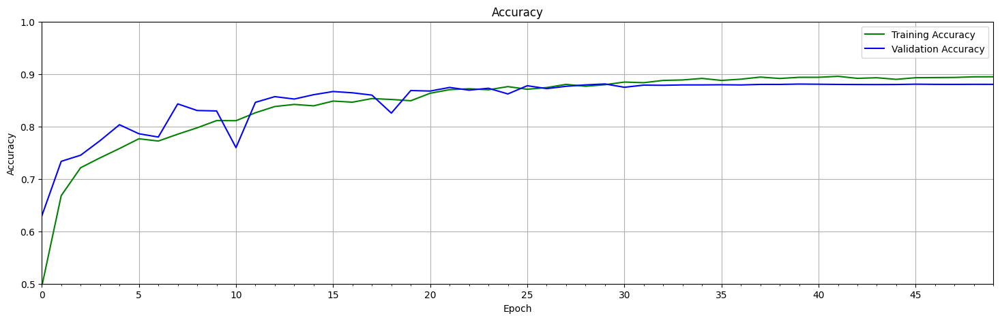

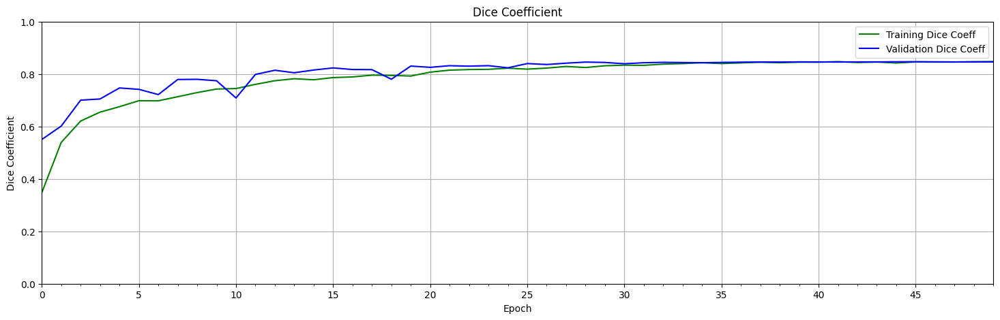

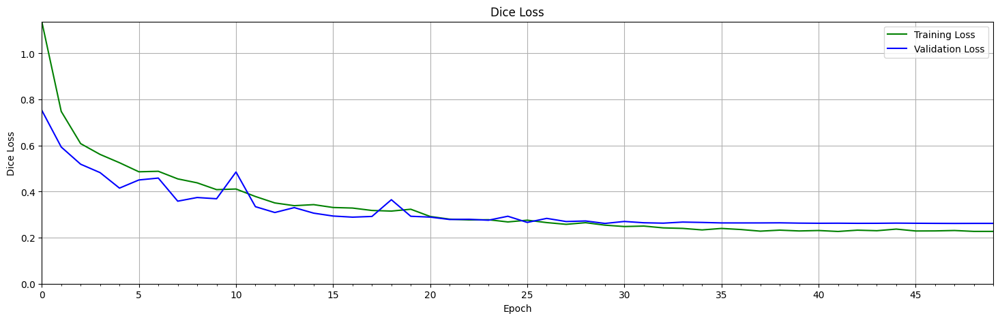

In [18]:
# Evaluate the trained model on the validation set
evaluate = trained_model.evaluate(valid_ds)

print(f"Model evaluation accuracy:  {evaluate[1]*100.:.3f}")
print(f"Model evaluation Dice:       {evaluate[2]*100.:.3f}")
print(f"Model evaluation loss:       {evaluate[0]*100.:.3f}")


# Pixel accuracy
history = training_results
train_acc = history.history["accuracy"]
valid_acc = history.history["val_accuracy"]


# Dice coefficient
train_dc = history.history["dice_coefficient"]
valid_dc = history.history["val_dice_coefficient"]



plot_results([ train_acc, valid_acc ], 
            ylabel="Accuracy",
            ylim = [0.5, 1.0],
            metric_name=["Training Accuracy", "Validation Accuracy"],
            color=["g", "b"])


plot_results([ train_dc, valid_dc ], 
            ylabel="Dice Coefficient",
            ylim = [0.0, 1.0],
            metric_name=["Training Dice Coeff", "Validation Dice Coeff"],
            color=["g", "b"])


train_loss = history.history["loss"]
valid_loss = history.history["val_loss"]

max_loss = max(max(train_loss), max(valid_loss))

plot_results([ train_loss, valid_loss ],        
            ylabel="Dice Loss", 
            ylim = [0.0, max_loss],
            metric_name=["Training Loss", "Validation Loss"],
            color=["g", "b"]);

## 9. Inference 

<font style="color:black">Note: Inference is performed on the original image size (512, 384) and not on any resized image used for training.</font>


In [ ]:
# load the trained weights in the model
#trained_model = tf.keras.models.load_model(checkpoint_file_path,custom_objects={'dice_coef_loss':combined_loss, 'Dice_coefficient':Dice_coefficient})

In [19]:
# Function to perform inference of the trained model on images
def inference(model, dataset):

    num_batches_to_process = 3# InferenceConfig.NUM_BATCHES

    
    for idx, data in enumerate(dataset):
        
        batch_img, batch_mask = data[0], data[1]

        

        # create new arrays to store the original size (480,640) resized images and masks
        original_batch_img = np.zeros((len(batch_img), 480, 640,3))
        original_batch_mask = np.zeros((len(batch_mask), 480, 640))
        original_batch_mask_predicted = np.zeros((len(batch_mask), 480, 640))

        #make predictions with the trained model
        pred_all = (model.predict(batch_img)).astype('float32')
        pred_all = pred_all.argmax(-1)
        batch_img = (batch_img).astype(np.float32)#.astype('uint8')

        
        if idx == num_batches_to_process:
            break

        for i in range(len(batch_img)-8, len(batch_img)): # to show 3 inferences

            fig = plt.figure(figsize=(20, 8))

            

            #resize original image, mask and predicted mask to the original size of (H,W) = (480,640)
            original_batch_img[i] = cv2.resize(batch_img[i], (640, 480))
            original_batch_mask[i] = cv2.resize(batch_mask[i], (640, 480))
            original_batch_mask_predicted[i] = cv2.resize(pred_all[i].astype(np.float32), (640, 480), interpolation = cv2.INTER_LINEAR )

            print(batch_img[i].shape[:])
            print(pred_all[i].shape[:])
            print(original_batch_mask_predicted[i].shape[:])

            # Display the original image.
            ax1 = fig.add_subplot(1,4,1)
            ax1.imshow(original_batch_img[i]/255.)
            ax1.title.set_text('Actual frame')
            plt.axis('off')

            
            # Display the ground truth mask.
            true_mask_rgb = num_to_rgb(original_batch_mask[i], color_map=id2color)
            ax2 = fig.add_subplot(1,4,2)
            ax2.set_title('Ground truth labels')
            ax2.imshow(true_mask_rgb)
            plt.axis('off')

        
            # Display the predicted segmentation mask. 
            pred_mask_rgb = num_to_rgb(original_batch_mask_predicted[i], color_map=id2color)
            ax3 = fig.add_subplot(1,4,3)
            ax3.set_title('Predicted labels')
            ax3.imshow(pred_mask_rgb)
            plt.axis('off')

            

            

            # Display the predicted segmentation mask overlayed on the original image.
            overlayed_image = image_overlay(original_batch_img[i].astype(np.float32), pred_mask_rgb)
            ax4 = fig.add_subplot(1,4,4)
            ax4.set_title('Overlayed image')
            ax4.imshow(overlayed_image)
            plt.axis('off')
            
            #print(pred_mask_rgb.shape[:]) #(480, 640, 3)
            #print(pred_mask_rgb)
            
            plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
(256, 256, 3)
(256, 256)
(480, 640)


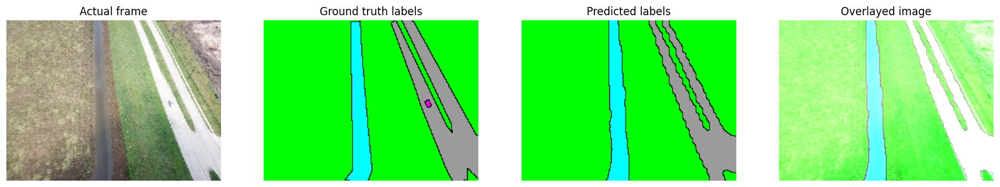

(256, 256, 3)
(256, 256)
(480, 640)


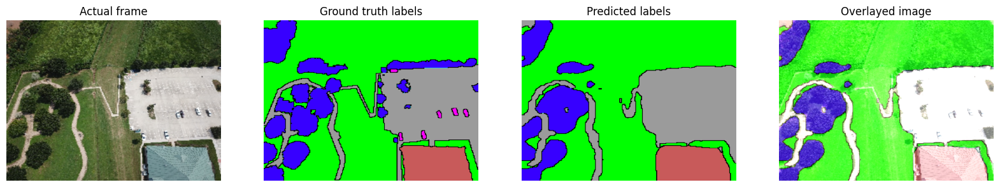

(256, 256, 3)
(256, 256)
(480, 640)


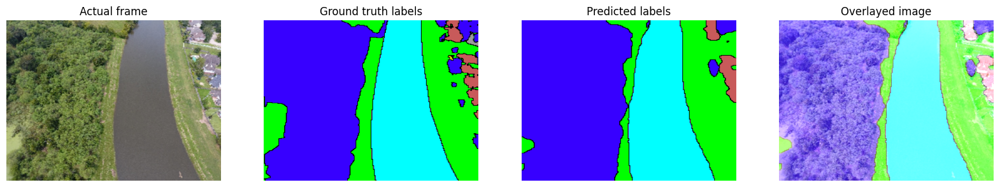

(256, 256, 3)
(256, 256)
(480, 640)


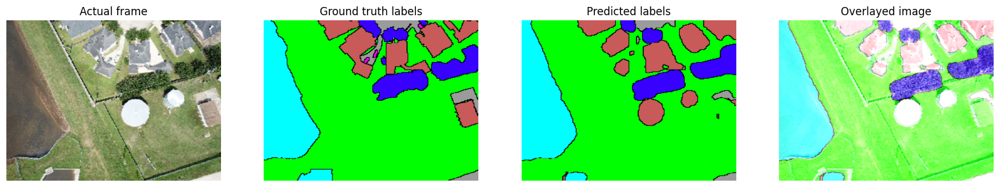

(256, 256, 3)
(256, 256)
(480, 640)


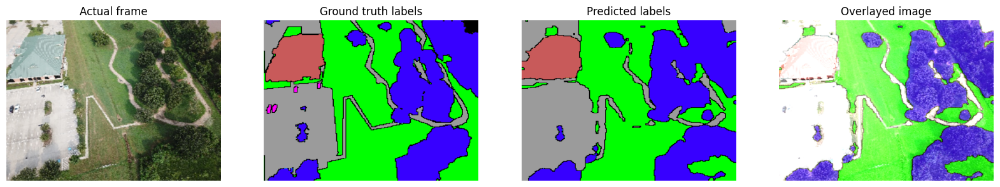

(256, 256, 3)
(256, 256)
(480, 640)


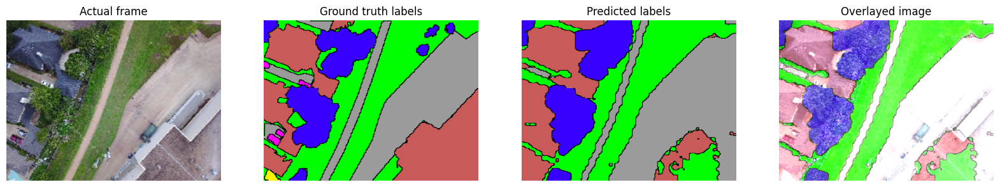

(256, 256, 3)
(256, 256)
(480, 640)


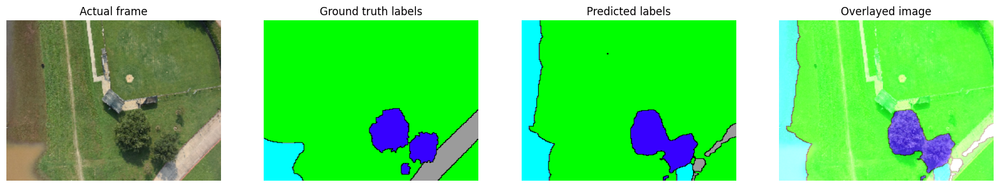

(256, 256, 3)
(256, 256)
(480, 640)


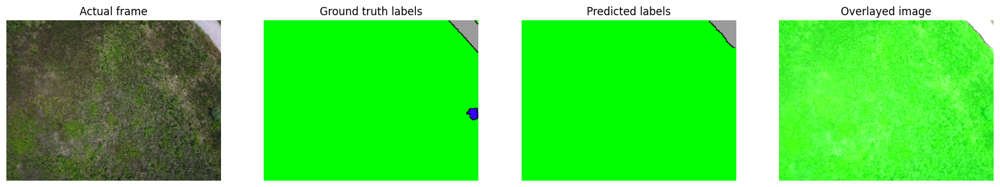

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
(256, 256, 3)
(256, 256)
(480, 640)


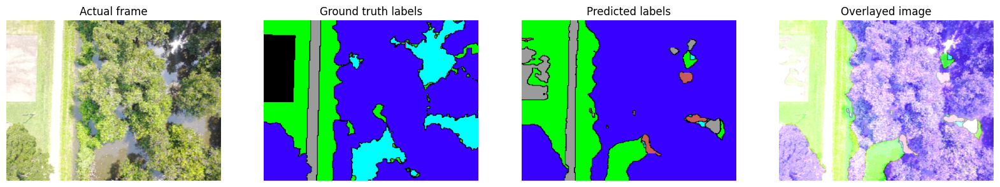

(256, 256, 3)
(256, 256)
(480, 640)


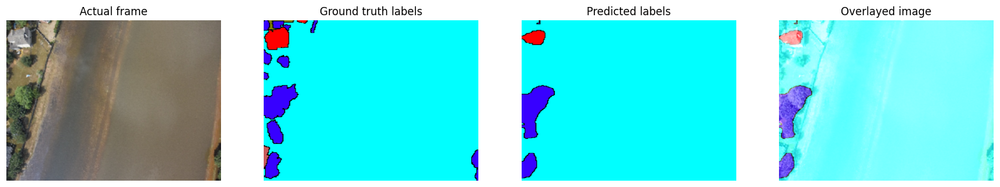

(256, 256, 3)
(256, 256)
(480, 640)


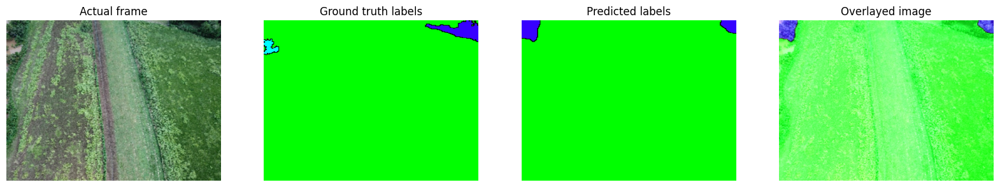

(256, 256, 3)
(256, 256)
(480, 640)


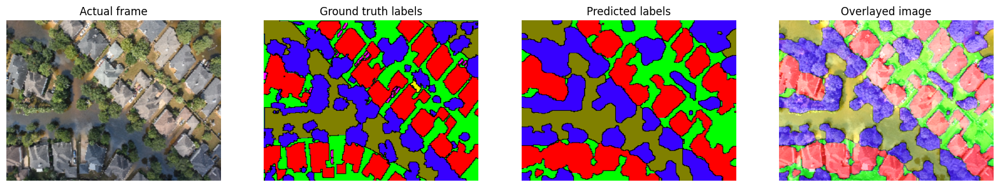

(256, 256, 3)
(256, 256)
(480, 640)


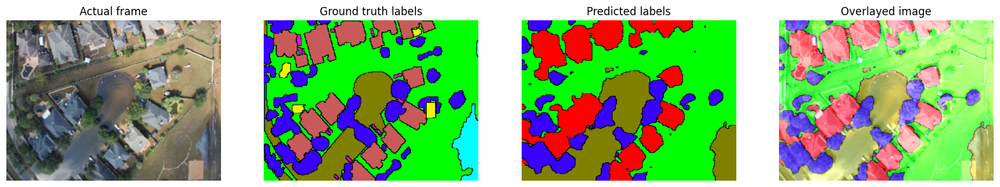

(256, 256, 3)
(256, 256)
(480, 640)


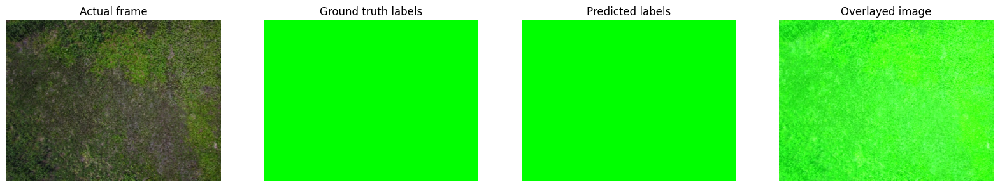

(256, 256, 3)
(256, 256)
(480, 640)


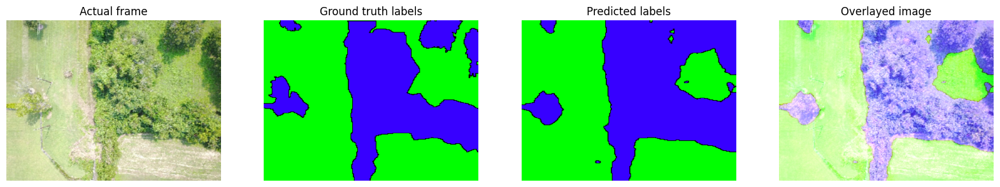

(256, 256, 3)
(256, 256)
(480, 640)


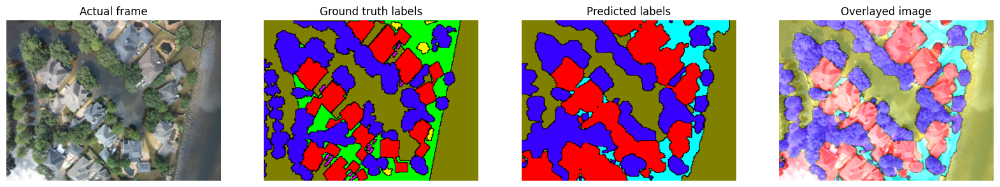

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
(256, 256, 3)
(256, 256)
(480, 640)


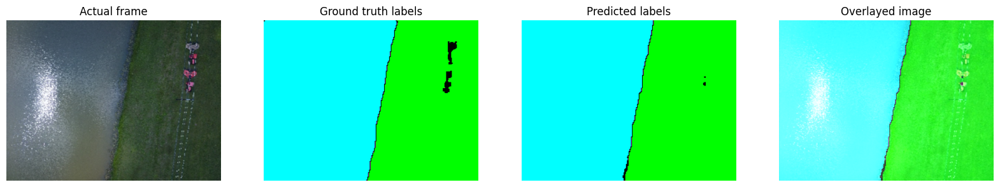

(256, 256, 3)
(256, 256)
(480, 640)


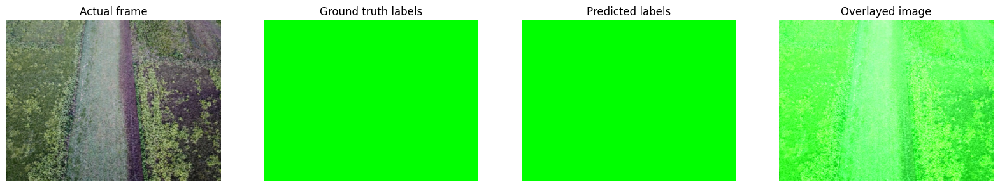

(256, 256, 3)
(256, 256)
(480, 640)


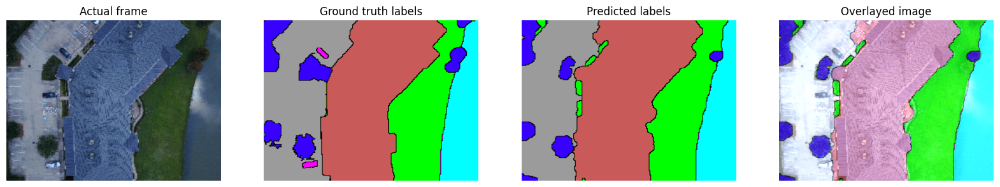

(256, 256, 3)
(256, 256)
(480, 640)


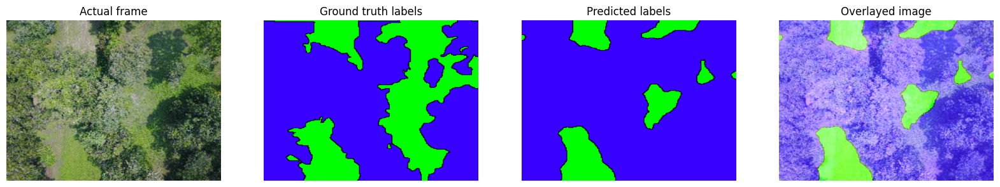

(256, 256, 3)
(256, 256)
(480, 640)


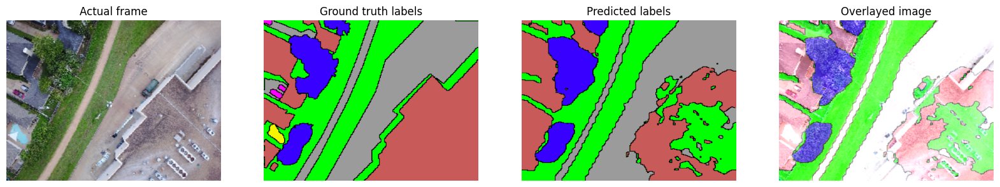

(256, 256, 3)
(256, 256)
(480, 640)


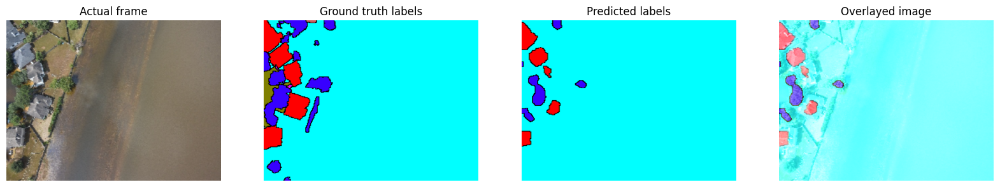

(256, 256, 3)
(256, 256)
(480, 640)


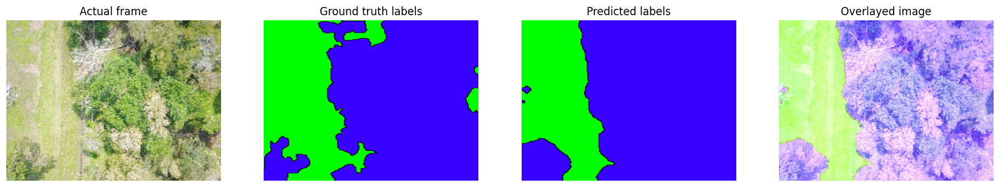

(256, 256, 3)
(256, 256)
(480, 640)


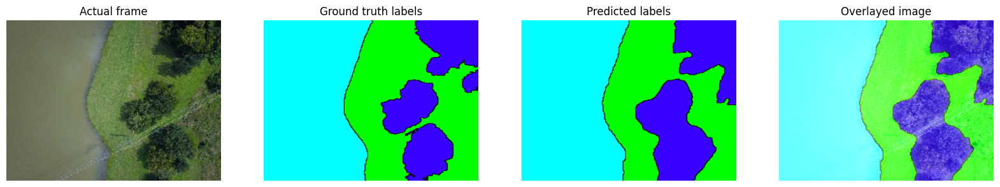

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step


In [20]:
# Perform inference on the validation set 
inference(trained_model, valid_ds)

## 10. Prepare submission.csv for the Kaggle Competition

**A note on how Run-length encoding for Kaggle competitions** (taken from [HuBMAP - Hacking the Kidney Competition](https://www.kaggle.com/code/leahscherschel/run-length-encoding/notebook))

> *To reduce the submission file size, teams must submit segmentation results using run-length encoding on the pixel values. Instead of submitting an exhaustive list of indices for your segmentation, you will submit pairs of values that contain a start position and a run length. E.g. `0 3` implies starting at `pixel 0` and running a total of `3` pixels `(0,1,2)`. The competition format requires a space-delimited list of pairs. For example, `0 3 10 5` implies pixels `0,1,2`, and `10,11,12,13,14` are to be included in the mask. The metric checks that the pairs are sorted and positive and the decoded pixel values are not duplicated. The pixels are numbered from **top to bottom, then left to right:** 0 is pixel (0,0), 1 is pixel (1,0), and 2 is pixel (2,0), etc.*

---

Additional RLE code discussion from the same competition: [Fast Code to Convert Mask to RLE](https://www.kaggle.com/competitions/hubmap-kidney-segmentation/discussion/232357)

In [21]:
#trained_model.summary()

In [22]:
# Function to encode the predicted masks in RLE format
def rle_encode(mask):
    """
    Efficient implementation of RLE encoding for a binary mask.
    
    Parameters:
      mask (numpy array): Binary mask for a specific class.
    
    Returns:
      str: RLE encoded string.
    """
    # Transpose the mask for Kaggle RLE format (top-to-bottom, then left-to-right)
    pixels = mask.T.flatten()
    pixels = np.pad(pixels, ((1, 1),))
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

# Function to create a .csv submission file required for the Kaggle submission process
def create_submission_csv(model, test_csv_path, test_image_folder, output_csv="submission.csv"):
    """
    Generate a submission CSV file with run-length encoding for each class per test image.
    
    For each test image, the submission will contain NUM_CLASSES rows in the format:
      {image_name}_{class_id:02d}, RLE_encoded_mask
    """
    import pandas as pd
    logging.info("Starting submission CSV creation process.")
    submission_data = []
    try:
        test_df = pd.read_csv(test_csv_path, header=None, names=["IMG_ID"])
    except Exception as e:
        logging.error(f"Failed to read test CSV: {e}")
        return

    # Process each unique test image once.
    unique_images = sorted(set([x.split('_')[0] for x in test_df["IMG_ID"].tolist()]))
    for base_name in unique_images:
        image_path = os.path.join(test_image_folder, f"{base_name}.jpg")
        if not os.path.exists(image_path):
            logging.warning(f"Test image not found: {image_path}. Skipping.")
            continue

        original_image = cv2.imread(image_path)
        if original_image is None:
            logging.warning(f"Failed to load test image: {image_path}. Skipping.")
            continue
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
        orig_h, orig_w = original_image.shape[:2]

        # Preprocess: normalize and resize to model input dimensions
        image = original_image.astype(np.float32) 
        image_resized = cv2.resize(image, (DatasetConfig.IMG_WIDTH, DatasetConfig.IMG_HEIGHT))
        try:
            pred = model.predict(image_resized[np.newaxis, ...])[0]
        except Exception as e:
            logging.error(f"Error during prediction for image {base_name}: {e}")
            continue
        
        # Get predicted class mask and resize back to original dimensions
        pred_class = np.argmax(pred, axis=-1)
        pred_resized = cv2.resize(pred_class, (orig_w, orig_h), interpolation=cv2.INTER_NEAREST)

        # For each class, generate RLE string
        for class_id in range(DatasetConfig.NUM_CLASSES):
            binary_mask = (pred_resized == class_id).astype(np.uint8)
            rle = rle_encode(binary_mask) if np.sum(binary_mask) > 0 else ""
            submission_data.append([f"{base_name}_{class_id:02d}", rle])

    submission_df = pd.DataFrame(submission_data, columns=["IMG_ID", "EncodedString"])
    try:
        submission_df.to_csv(output_csv, index=False)
        logging.info(f"Submission CSV saved as {output_csv}")
    except Exception as e:
        logging.error(f"Error saving CSV: {e}")

In [24]:
# Predict mask on the test set and create the submission.csv file
import logging
test_csv_path = "/kaggle/input/open-cv-tf-project-3-image-segmentation-round-3/test.csv"
test_image_folder = "/kaggle/input/open-cv-tf-project-3-image-segmentation-round-3/Project_3_FloodNet_Dataset/test/images/"
create_submission_csv(trained_model, test_csv_path, test_image_folder, output_csv="submission.csv")
print("Submission CSV created successfully.")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

## 11. Kaggle Submission Score : 83.6%

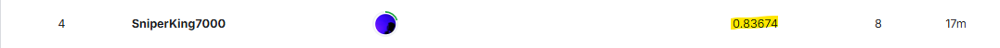
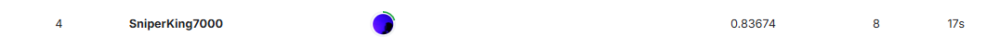